# Moth Detection Workshop

*This notebook executes pre-processing and detection/classification tasks using Computer Vision techniques and trained models from researchers of [CV JENA]*

[CV JENA]: https://pub.inf-cv.uni-jena.de/pdf/korsch2021deep.pdf

## Installation

We suggest, based from the guidance of researchers to use [miniconda]. All required libraries are listed in the `requirements.txt` and can be installed with `pip`:

```sh
conda create -n moth_detect_demo python~=3.8.0
conda activate moth_detect_demo
pip install numpy
pip install -r requirements.txt
conda install conda-forge::opencv
conda install "setuptools <65"
```

Then launch a jupyter lab instance

```sh
jupyter lab
```

[miniconda]: https://docs.conda.io/en/latest/miniconda.html

## Preprocessing

*This part is executed to crop the frame of the camera trap images and retain only white landing area of the light trap*

Technical techniques used : 
- Open CV filtering

In [13]:
import cv2
import numpy as np
from IPython.display import display, Image

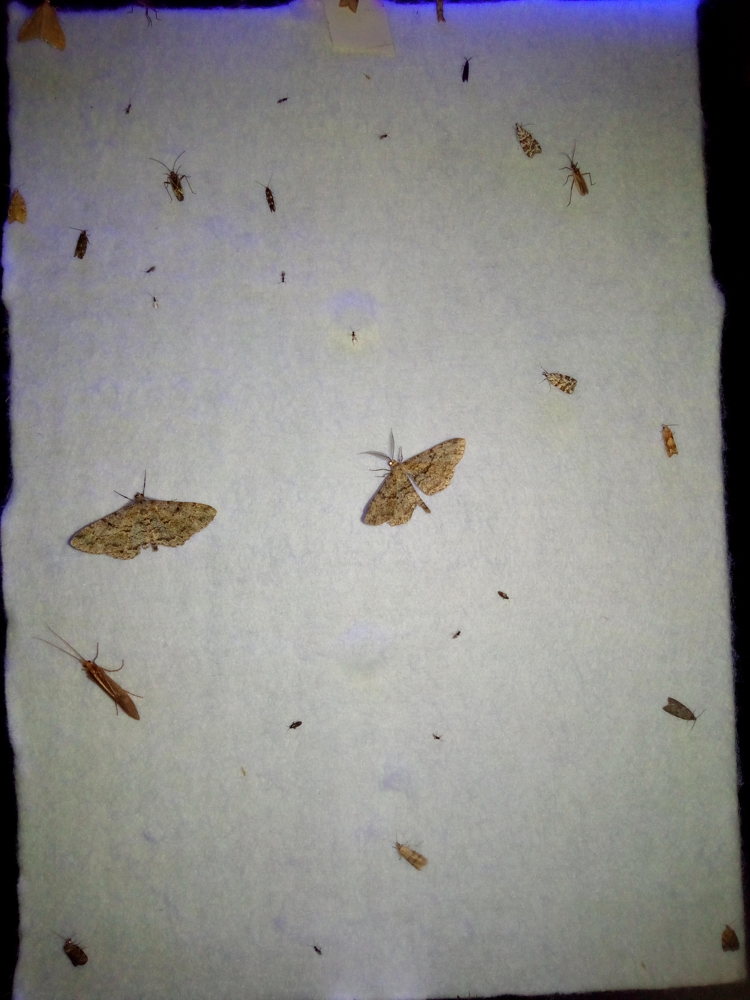

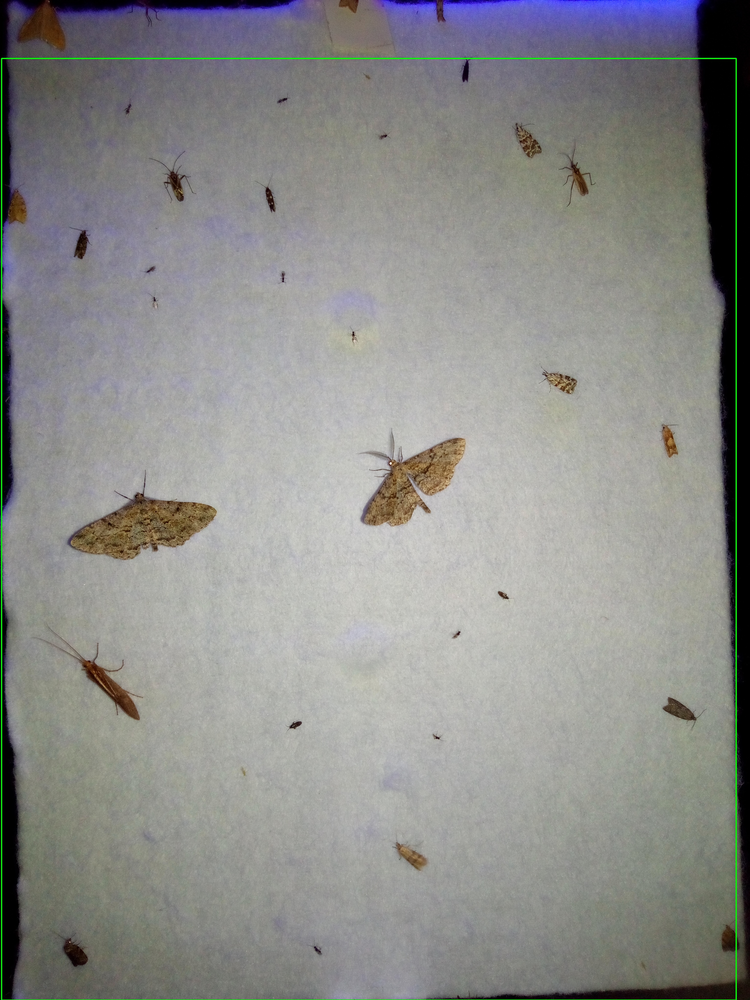

True

In [14]:
filename = 'sample/0_moth_rush_hour.jpg'
#filename = 'sample/1_moths_after_a_pint_or_two.jpg'
#filename = 'sample/2_moth_afterwork.jpg'

img = cv2.imread(filename)
display(Image(filename=filename))
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
#value_thresh = 200
value_thresh = 120
_, thresh = cv2.threshold(gray, value_thresh, 255, cv2.THRESH_BINARY)
contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
largest_contour = max(contours, key=cv2.contourArea)
x, y, w, h = cv2.boundingRect(largest_contour)

# Make a copy for visualization
vis_img = img.copy()

# Draw rectangle (green color, thickness 3)
cv2.rectangle(vis_img, (x, y), (x + w, y + h), (0,255,0), 3)



# Or save to disk
cv2.imwrite('visualized_rectangle.jpg', vis_img)
display(Image(filename='visualized_rectangle.jpg'))

cropped_img = img[y:y+h, x:x+w]
cv2.imwrite('cropped_rectangle.jpg', cropped_img)

## Data and Model Weights from CV JENA

### Data
The [EU-Moths][1] dataset can be downloaded from the given URL. In this notebook, we assume that the uncropped version of it is located under `/home/korsch/Data/datasets/moths/eu_moths/uncropped/ORIGINAL`. Set the `root` attribute of the `Args` class accordingly when you create an instance of it to match the location of your dataset. Please consult this [GitHub repository][2] to get more information about the [MCC] dataset.

### Model Weights

Download the weights of the detector and the classifier and move them in the same directory as the jupyter notebook:
* [Classifier] (~ 84.7 MB)
* [Detector] (~ 78.8 MB)

[1]: https://www.inf-cv.uni-jena.de/eu_moths_dataset
[2]: https://github.com/kimbjerge/MCC-trap/
[MCC]: https://github.com/kimbjerge/MCC-trap/tree/master/data
[Classifier]: https://github.com/DiKorsch/moth_scanner_demo/releases/download/v1.0.0/classifier.npz
[Detector]: https://github.com/DiKorsch/moth_scanner_demo/releases/download/v1.0.0/detector.npz

In [3]:
import abc
import chainer
import numpy as np
import pyaml
import os

from chainer import functions as F
from chainer.serializers import load_npz
from chainer.datasets import TransformDataset
from chainer.backends import cuda
from chainercv import transforms as tr
from chainercv import visualizations as vis
from chainercv.links.model.ssd import SSD300

from dataclasses import dataclass
from pathlib import Path
from PIL import Image
from matplotlib import pyplot as plt
from tqdm.auto import tqdm

from cvmodelz.models import ModelFactory

In [4]:
@dataclass
class Args:
    def __str__(self):
        return pyaml.dump(dict(Arguments=self.__dict__), sort_dicts=False)
    
    # data options
    root:                      str  = "/Users/efoissotte/Dev/missions/noe/moth_scanner_demo"
    
    # classifier model options
    clf_model_type:            str  = "cvmodelz.InceptionV3" # used model with pre-trained weights
    clf_weights:               str  = "classifier.npz"
        
    n_classes:                 int  = 200
    class_names:               str  = "class_names.txt"

    # detection model options
    det_model_type:            str  = "ssd" # used detector with pre-trained weights
    det_weights:               str  = "detector.npz" 
    det_input_size:            int  = 300
    
    # -1 = CPU, <int> = GPU ID (works only if you installed cupy)
    gpu:                       int  = -1
    extensions:                tuple = (".jpg", ".png", ".jpeg")
    

In [5]:
class BaseTransform:
    def __init__(self, size: int, *args, **kwargs):
        super().__init__()
        self._size = size
    
    @property
    def size(self):
        return (self._size, self._size)
    
    
class BaseWrapper(abc.ABC):
    
    def __init__(self, model: chainer.Chain, transform: BaseTransform):
        super().__init__()
        
        self.model = model
        self.transform = transform
    
    def __call__(self, *inputs):
        orig, X, *_ = self.transform(inputs)
        # either numpy or cupy
        xp = self.model.xp
        
        
        # reshape X from CxHxW to 1xCxHxW, before calling the model
        output = self.model(xp.array(X[None]))
        return self.output_transform(output)

    @abc.abstractmethod
    def output_transform(self, output):
        return output


# Detector 

In [7]:
_unpack = chainer.as_array


class DetectorTransform(BaseTransform):
    def __init__(self, *args, **kwargs):
        super().__init__(*args, **kwargs)

    def __call__(self, data):
        orig, *_ = data
        
        im = tr.scale(orig, self._size, fit_short=True)
        im = tr.center_crop(im, self.size)
        
        return [orig, im] + _
    
class DetectorWrapper(BaseWrapper):
    
    def decode(self, loc, conf):
        return self.model.coder.decode(
            _unpack(loc), 
            _unpack(conf),
            self.model.nms_thresh,
            self.model.score_thresh)

    
    def output_transform(self, output):
        locs, confs = output
        bboxes, labels, scores = [], [], []

        for loc, conf in zip(_unpack(locs), _unpack(confs)):
            bbox, label, score = self.decode(loc, conf)
            bboxes.append(cuda.to_cpu(bbox))
            labels.append(cuda.to_cpu(label))
            scores.append(cuda.to_cpu(score))

        return bboxes, labels, scores

def init_detector(args: Args):
    model = SSD300(n_fg_class=1)
    model.use_preset("evaluate")
    
    model.nms_thresh = 0.25
    
    load_npz(args.det_weights, model, path="model/", strict=True)
    
    transform = DetectorTransform(size=args.det_input_size)
    
    return DetectorWrapper(model, transform)


def project_back_bbox(bboxes, orig, size=300):
    _orig = orig.transpose(2, 0, 1)
    C, H, W = _orig.shape
    h = w = size

    size = min(H, W)
    _, params = tr.center_crop(_orig, (size, size), return_param=True)

    x_offset = params["x_slice"].start
    y_offset = params["y_slice"].start

    bboxes = tr.resize_bbox(bboxes, (h,w), (size, size))

    bboxes[:, 0] += y_offset
    bboxes[:, 1] += x_offset
    bboxes[:, 2] += y_offset
    bboxes[:, 3] += x_offset

    return bboxes

# Classifier

In [8]:
class ClassifierTransform(BaseTransform):
    
    def __init__(self, prepare_func, *args, **kwargs):
        super().__init__(*args, **kwargs)
        self._prepare = prepare_func
        self._kwargs = kwargs
    
    def __call__(self, data):
        orig, *_ = data 
        im = self._prepare(orig.transpose(1, 2, 0), **self._kwargs)
        im = tr.center_crop(im, self.size)
        return [orig, im] + _

class ClassifierWrapper(BaseWrapper):
    
    def output_transform(self, output):
        output.to_cpu()
        return output
#         return F.argmax(output, axis=1)

def init_classifier(args: Args):
    
    model = ModelFactory.new(args.clf_model_type)
    model.load_for_inference(args.clf_weights, n_classes=args.n_classes, path="model/", strict=True)
    
    transform = ClassifierTransform(model.meta.prepare_func, 
                                    model.meta.input_size, 
                                    keep_ratio=True, 
                                    swap_channels=False,
                                   )
    
    return ClassifierWrapper(model, transform)

# Dataset

In [9]:
def _is_image(imname, extensions):
    return Path(imname).suffix.lower() in extensions

def new_dataset(args: Args):
    root = Path(args.root)
    
    if (root / "images.txt").exists():
        paths = str(root / "images.txt")
        imroot = root / "images"
        
    else:
        paths = []
        for path, folders, filenames in os.walk(root):
            paths.extend([Path(path, fname) for fname in filenames if _is_image(fname, args.extensions)])
        
        imroot = root
        paths = [p.relative_to(root) for p in paths]
    
    return chainer.datasets.ImageDataset(paths, imroot, dtype=np.float32), paths

# Detection and Classification Pipeline

In [10]:
from pathlib import Path
import json

class NumpyEncoder(json.JSONEncoder):
    def default(self, obj):
        if isinstance(obj, np.ndarray):
            return obj.tolist()
        return super().default(obj)

def gpu_config(args: Args, clf: BaseWrapper, det: BaseWrapper):
    gpu = args.gpu
    
    if gpu < 0:
        # CPU mode
        return

    device = cuda.get_device_from_id(gpu)
    device.use()
    
    clf.model.to_device(device)
    det.model.to_device(device)

def show_detections(im, bboxes, labels, label_names, save_path):
    assert im.shape[-1] == 3, "im must be in HWC format!"
    
    fig, ax = plt.subplots(figsize=(16,9))

    # dump detection_json_info
    det_info = {
        "labels" : labels,
        "bbox": bboxes
    }
    print(det_info)

    info_path = save_path.parent / Path('detections.json')
    
    with open(info_path, 'w') as output:
        json.dump(det_info, output, indent=4, cls=NumpyEncoder)
    # get the best label
    labels = np.array(labels)[:, 0]
    vis.vis_bbox(im.transpose(2,0,1), bboxes, labels, label_names=label_names, ax=ax)
    
    plt.savefig(save_path)

        
    
    plt.show()
    plt.close()

def square_crop(im, bbox):
    y0, x0, y1, x1 = bbox
    w, h = x1 - x0, y1 - y0
    size = max([w, h])

    dw, dh = (size - w) / 2, (size - h) / 2
    y0, y1 = max(int(y0 - dh), 0), int(y0 - dh + size)
    x0, x1 = max(int(x0 - dw), 0), int(x0 - dw + size)
    return im[:, y0:y1, x0:x1]
    
    
def classify_crops(im, bboxes, clf, topk=5):
    assert im.shape[0] == 3, "im must be in CHW format!"
    
    res = []
    for bbox in bboxes:
        crop = square_crop(im, bbox)
        
        logits = _unpack(clf(crop))[0]
        res.append(np.argsort(-logits)[:topk])
        
    return res
    
def main(args: Args):
    data, paths = new_dataset(args)
    
    print(f"Found {len(data)} images in \"{args.root}\"")
    
    clf = init_classifier(args)
    det = init_detector(args)
    
    class_names = np.loadtxt(args.class_names, dtype=str)
    
    gpu_config(args, clf, det)

    # modify or comment below to parse a subset of data
    size = 2
    idxs = np.random.choice(len(data), size=size, replace=False)
    
    # uncomment below to parse all data
    #idxs = range(len(data))
    
    for i in tqdm(idxs):
        im, path = data[i], paths[i]

        save_path = Path(args.root).parent / Path("output") / path.stem
        save_path.mkdir(exist_ok=True)
        
        orig = im.transpose(1,2,0).astype(np.uint8)

        # show detections
        _bboxes, det_labels, det_scores = det(im)
        print(_bboxes, det_labels, det_scores)
        bboxes = project_back_bbox(_bboxes[0], orig, size=args.det_input_size)
        
        predictions = classify_crops(im, bboxes, clf)
        print("predictions", predictions)
        
        det_path = save_path / Path("detections.png")
        show_detections(orig, bboxes, predictions, class_names, det_path)
            
    return

In [ ]:
import os

DATA_ROOT = Path(os.getcwd())

EU_MOTHS = "images"
MCC_MOTHS = "MCC"

args = Args(
    root = DATA_ROOT / EU_MOTHS,
)
print(args)

with chainer.using_config("train", False), chainer.no_backprop_mode():
    main(args)

# Actual baseline generation Pipeline

_This part is specific for Noe's internal process, to show a baseline about ground truth. It's kept it to show how to retrieve information about ground truth._

In [15]:
!head -n 5 cvat.csv

session_id,image_id,image_name,identificator,sexe,espece,genre,famille,taille,ordre,xtl,ytl,xbr,ybr
246,11,d993cbcac4f4c385fab2518b28f87ec7,,inconnu,,,Pyralidae,micro,Lepidoptera,935.15,1819.65,1099.24,2038.92
246,10,c6e5a212a125c0c869d9b43f31d723a3,,inconnu,,,,micro,Lepidoptera,2302.33,89.58,2401.08,204.29
246,6,848ebf3caa4eba97bc3923336a5c8a74,,inconnu,,,,micro,Lepidoptera,1960.38,1505.33,2051.42,1585.16
246,5,6e57a4c342efa000eedaa8689a020d5c,,inconnu,,,Pyralidae,micro,Lepidoptera,2339.0,898.44,2428.0,1049.68


In [ ]:
cvat_dict = {}
id_list = []
import csv

with open('cvat.csv', newline='') as csvfile:    
    reader = csv.DictReader(csvfile, delimiter=',')
    
    for row in reader:
        id_list.append(row['image_name'])

id_list = list(set(id_list))
for id_img in id_list:
    cvat_dict[id_img] = {
        'bboxs': [],
        'especes': [],
    }

with open('cvat.csv', newline='') as csvfile:    
    reader2 = csv.DictReader(csvfile, delimiter=',')

    for row in reader2:
        cvat_dict[row['image_name']]['bboxs'].append( 
            [row['ytl'], row['xtl'], row['ybr'], row['xbr']]
        )
        cvat_dict[row['image_name']]['especes'].append(
            row['espece']
        )
actual_class_names = np.loadtxt('especes_cvat.csv', dtype=str, delimiter=',')

In [ ]:
def show_actual(im, bboxes, labels, label_names, save_path):
    assert im.shape[-1] == 3, "im must be in HWC format!"
    
    fig, ax = plt.subplots(figsize=(16,9))

    # dump detection_json_info
    actual_info = {
        "labels" : labels,
        "bbox": bboxes
    }

    info_path = save_path.parent / Path('actuals.json')
    
    with open(info_path, 'w') as output:
        json.dump(actual_info, output, indent=4, cls=NumpyEncoder)
        
    # get the best label
    labels = np.array(labels)[:, 0]
    vis.vis_bbox(im.transpose(2,0,1), bboxes, labels, label_names=label_names, ax=ax)
    
    plt.savefig(save_path)
    plt.close()

def encode_actuals(predictions, class_names):
    """
    Transform the label (class name) into an int id corresponding to its index in class_names.
    
    Args:
        predictions (list or np.array): List of class names (strings) to map.
        class_names (list or np.array): Array/list of all possible class names.
        
    Returns:
        np.array: Array of integer ids corresponding to class_names indices.
    """
    # Ensure both are numpy arrays for fast mapping
    predictions = np.array(predictions).flatten()
    class_names = np.array(class_names).flatten()
    
    # Build mapping: {class_name: id}
    name_to_id = {name: idx for idx, name in enumerate(class_names)}
    
    # Map each prediction to its id, fallback to 0 if not found
    ids = np.array([np.array([name_to_id.get(pred, 1)]) for pred in predictions])
    return ids

def save_bbox_info(im, bbox, label_id, class_names, save_dir, bbox_idx):
    # bbox: [ytl, xtl, ybr, xbr]
    ytl, xtl, ybr, xbr = map(int, bbox)
    cropped_im = im[ytl:ybr, xtl:xbr, :]  # crop the image
    
    # Save cropped image
    crop_img_path = save_dir / f'bbox_{bbox_idx}.png'
    Image.fromarray(cropped_im).save(crop_img_path)
    
    # Save actual.json
    label_name = class_names[label_id]
    info = {
        "label_id": int(label_id),
        "label_name": str(label_name),
        "bbox": [float(ytl), float(xtl), float(ybr), float(xbr)],
        "cropped_image": str(crop_img_path)
    }
    json_path = save_dir / "actual.json"
    # If actual.json already exists, append; else create list
    if json_path.exists():
        with open(json_path, "r") as f:
            data = json.load(f)
        if isinstance(data, list):
            data.append(info)
        else:
            data = [data, info]
    else:
        data = [info]
    with open(json_path, "w") as f:
        json.dump(data, f, indent=4)

def main_actual():
    
    data, paths = new_dataset(args)
    print(f"Found {len(data)} images in \"{args.root}\"")

    idxs = range(len(data))
    
    for i in tqdm(idxs):
        im, path = data[i], paths[i]
        orig = im.transpose(1,2,0).astype(np.uint8)
        orig= im
        
        save_path = Path(args.root).parent / Path("output") / path.stem
        im_id = path.stem
        if im_id in cvat_dict.keys():
            save_path.mkdir(exist_ok=True)


            bboxs = np.array(cvat_dict[im_id]['bboxs'], dtype=np.float32)
            predictions = np.array([[np.array(espece)] for espece in cvat_dict[im_id]['especes']])

            label_ids = encode_actuals(predictions, actual_class_names)

            vis.vis_bbox(orig, bboxs)
            actual_path = save_path / Path("actuals.png")
            orig = im.transpose(1,2,0).astype(np.uint8)

            # Save each bbox info/crop in its subfolder
            bbx_img_folder = save_path / "bboxs_actual"
            bbx_img_folder.mkdir(exist_ok=True)
            for bbox_idx, (bbox, label_id) in enumerate(zip(bboxs, label_ids)):
                save_bbox_info(orig, bbox, label_id, actual_class_names, bbx_img_folder, bbox_idx)

        
            show_actual(
                im=orig,
                bboxes=bboxs,
                labels=label_ids,
                label_names=actual_class_names,
                save_path=actual_path
            )

main_actual()
